In [ ]:
!pip install pycaret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached MarkupSafe-2.1.1-cp37-cp37m-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (25 kB)
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 2.0.1
    Uninstalling MarkupSafe-2.0.1:
      Successfully uninstalled MarkupSafe-2.0.1


In [ ]:
from pycaret.utils import enable_colab 
enable_colab()

Colab mode enabled.


In [ ]:
pip install markupsafe==2.0.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached MarkupSafe-2.0.1-cp37-cp37m-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_12_x86_64.manylinux2010_x86_64.whl (31 kB)
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 2.1.1
    Uninstalling MarkupSafe-2.1.1:
      Successfully uninstalled MarkupSafe-2.1.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pandas-profiling 3.2.0 requires markupsafe~=2.1.1, but you have markupsafe 2.0.1 which is incompatible.


In [ ]:
from pycaret.datasets import get_data
dataset = get_data('Match', profile=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
dataset.shape

(577, 19)

In [ ]:
data = dataset.sample(frac=0.95, random_state=786)
data_unseen = dataset.drop(data.index)

data.reset_index(inplace=True, drop=True)
data_unseen.reset_index(inplace=True, drop=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (548, 19)
Unseen Data For Predictions: (29, 19)


In [ ]:
from pycaret.classification import *

In [ ]:
dataset.head()

,Match_Id,Match_Date,Team_Name_Id,Opponent_Team_Id,Season_Id,Venue_Name,Toss_Winner_Id,Toss_Decision,IS_Superover,IS_Result,Is_DuckWorthLewis,Win_Type,Won_By,Match_Winner_Id,Man_Of_The_Match_Id,First_Umpire_Id,Second_Umpire_Id,City_Name,Host_Country
0,335987,18-Apr-08,2,1,1,M Chinnaswamy Stadium,2,field,0,1,0,by runs,140.0,1.0,2.0,470,477,Bangalore,India
1,335988,19-Apr-08,4,3,1,"Punjab Cricket Association Stadium, Mohali",3,bat,0,1,0,by runs,33.0,3.0,19.0,471,487,Chandigarh,India
2,335989,19-Apr-08,6,5,1,Feroz Shah Kotla,5,bat,0,1,0,by wickets,9.0,6.0,90.0,472,512,Delhi,India
3,335990,20-Apr-08,7,2,1,Wankhede Stadium,7,bat,0,1,0,by wickets,5.0,2.0,11.0,473,476,Mumbai,India
4,335991,20-Apr-08,1,8,1,Eden Gardens,8,bat,0,1,0,by wickets,5.0,1.0,4.0,474,486,Kolkata,India


In [ ]:
exp_clf102 = setup(data = data, target = 'Is_DuckWorthLewis', session_id=123,
                   use_gpu= True,
                  normalize = True, 
                  transformation = True, 
                  ignore_low_variance = True,
                  remove_multicollinearity = True, multicollinearity_threshold = 0.95,
                  bin_numeric_features = ['Match_Id', 'Won_By'],
                  log_experiment = True, experiment_name = 'match1')

,Description,Value
0,session_id,123
1,Target,Is_DuckWorthLewis
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(548, 19)"
5,Missing Values,True
6,Numeric Features,5
7,Categorical Features,12
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:Logging experiment in MLFlow
2022/09/06 18:04:39 INFO mlflow.tracking.fluent: Experiment with name 'match1' does not exist. Creating a new experiment.
INFO:logs:SubProcess save_model() called ==================================
INFO:logs:Initializing save_model()
INFO:logs:save_model(model=Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[],
                                      target='Is_DuckWorthLewis',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_num

In [ ]:
top3 = compare_models(n_select = 3)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9740,0.5986,0.1,0.1000,0.1000,0.1000,0.1000,0.051
lr,Logistic Regression,0.9713,0.5513,0.0,0.0000,0.0000,0.0000,0.0000,0.029
knn,K Neighbors Classifier,0.9713,0.6055,0.0,0.0000,0.0000,0.0000,0.0000,0.069
rf,Random Forest Classifier,0.9713,0.7865,0.0,0.0000,0.0000,0.0000,0.0000,0.789
gbc,Gradient Boosting Classifier,0.9713,0.6046,0.1,0.1000,0.1000,0.0973,0.0973,0.135
et,Extra Trees Classifier,0.9713,0.5322,0.0,0.0000,0.0000,0.0000,0.0000,0.769
dummy,Dummy Classifier,0.9713,0.5000,0.0,0.0000,0.0000,0.0000,0.0000,0.007
ridge,Ridge Classifier,0.9688,0.0000,0.0,0.0000,0.0000,-0.0035,-0.0038,0.021
dt,Decision Tree Classifier,0.9451,0.4866,0.0,0.0000,0.0000,-0.0199,-0.0208,0.012
svm,SVM - Linear Kernel,0.9451,0.0000,0.0,0.0000,0.0000,-0.0188,-0.0203,0.011


INFO:logs:create_model_container: 14
INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:[LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0), LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False), KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     me

In [ ]:
type(top3)

list

In [ ]:
print(top3)

[LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0), LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False), KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')]


In [ ]:
dt = create_model('dt', fold = 5)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9481,0.7300,0.5000,0.2500,0.3333,0.3094,0.3297
1,0.9740,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9351,0.6464,0.3333,0.2500,0.2857,0.2524,0.2553
3,0.9474,0.4865,0.0000,0.0000,0.0000,-0.0270,-0.0270
4,0.8947,0.4595,0.0000,0.0000,0.0000,-0.0411,-0.0481
Mean,0.9398,0.5645,0.1667,0.1000,0.1238,0.0987,0.1020
Std,0.0259,0.1052,0.2108,0.1225,0.1524,0.1504,0.1581


INFO:logs:create_model_container: 15
INFO:logs:master_model_container: 15
INFO:logs:display_container: 3
INFO:logs:DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')
INFO:logs:create_model() succesfully completed......................................


In [ ]:
rf = create_model('rf', round = 2)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.97,0.25,0.0,0.0,0.0,0.0,0.0
1,0.97,1.00,0.0,0.0,0.0,0.0,0.0
2,0.95,0.64,0.0,0.0,0.0,0.0,0.0
3,0.97,0.93,0.0,0.0,0.0,0.0,0.0
4,0.97,1.00,0.0,0.0,0.0,0.0,0.0
5,0.97,0.72,0.0,0.0,0.0,0.0,0.0
6,0.97,0.95,0.0,0.0,0.0,0.0,0.0
7,0.97,0.97,0.0,0.0,0.0,0.0,0.0
8,0.97,0.77,0.0,0.0,0.0,0.0,0.0


INFO:logs:create_model_container: 16
INFO:logs:master_model_container: 16
INFO:logs:display_container: 4
INFO:logs:RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=123, verbose=0,
                       warm_start=False)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
tuned_rf = tune_model(rf, optimize = 'AUC')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9231,0.4605,0.0,0.0000,0.0000,-0.0354,-0.0377
1,0.9744,0.9737,1.0,0.5000,0.6667,0.6549,0.6977
2,0.9231,0.4730,0.0,0.0000,0.0000,-0.0354,-0.0377
3,0.9211,0.4730,0.0,0.0000,0.0000,-0.0364,-0.0387
4,0.8947,0.9459,1.0,0.2000,0.3333,0.3028,0.4223
5,0.8158,0.4054,0.0,0.0000,0.0000,-0.0472,-0.0712
6,0.9474,0.9865,1.0,0.3333,0.5000,0.4795,0.5615
7,0.9474,1.0000,1.0,0.3333,0.5000,0.4795,0.5615
8,0.9474,0.9730,1.0,0.3333,0.5000,0.4795,0.5615


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 5
INFO:logs:RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=6, max_features=1.0, max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0,
                       min_impurity_split=None, min_samples_leaf=4,
                       min_samples_split=7, min_weight_fraction_leaf=0.0,
                       n_estimators=200, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


In [ ]:
tuned_rf2 = tune_model(rf, optimize = 'Recall')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9231,0.4605,0.0,0.0000,0.0000,-0.0354,-0.0377
1,0.9744,0.9737,1.0,0.5000,0.6667,0.6549,0.6977
2,0.9231,0.4730,0.0,0.0000,0.0000,-0.0354,-0.0377
3,0.9211,0.4730,0.0,0.0000,0.0000,-0.0364,-0.0387
4,0.8947,0.9459,1.0,0.2000,0.3333,0.3028,0.4223
5,0.8158,0.4054,0.0,0.0000,0.0000,-0.0472,-0.0712
6,0.9474,0.9865,1.0,0.3333,0.5000,0.4795,0.5615
7,0.9474,1.0000,1.0,0.3333,0.5000,0.4795,0.5615
8,0.9474,0.9730,1.0,0.3333,0.5000,0.4795,0.5615


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 6
INFO:logs:RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=6, max_features=1.0, max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0,
                       min_impurity_split=None, min_samples_leaf=4,
                       min_samples_split=7, min_weight_fraction_leaf=0.0,
                       n_estimators=200, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


In [ ]:
plot_model(tuned_rf, plot = 'parameter')

,Parameters
bootstrap,False
ccp_alpha,0.0
class_weight,balanced_subsample
criterion,gini
max_depth,6
max_features,1.0
max_leaf_nodes,None
max_samples,None
min_impurity_decrease,0
min_impurity_split,None


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_rf2, plot = 'parameter')

,Parameters
bootstrap,False
ccp_alpha,0.0
class_weight,balanced_subsample
criterion,gini
max_depth,6
max_features,1.0
max_leaf_nodes,None
max_samples,None
min_impurity_decrease,0
min_impurity_split,None


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
dt = create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9231,0.4737,0.0,0.0,0.0,-0.0354,-0.0377
1,0.9744,0.5000,0.0,0.0,0.0,0.0000,0.0000
2,0.9487,0.5000,0.0,0.0,0.0,0.0000,0.0000
3,0.9737,0.5000,0.0,0.0,0.0,0.0000,0.0000
4,0.9474,0.4865,0.0,0.0,0.0,-0.0270,-0.0270
5,0.9211,0.4730,0.0,0.0,0.0,-0.0364,-0.0387
6,0.9474,0.4865,0.0,0.0,0.0,-0.0270,-0.0270
7,0.9737,0.5000,0.0,0.0,0.0,0.0000,0.0000
8,0.9211,0.4730,0.0,0.0,0.0,-0.0364,-0.0387


INFO:logs:create_model_container: 19
INFO:logs:master_model_container: 19
INFO:logs:display_container: 7
INFO:logs:DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')
INFO:logs:create_model() succesfully completed......................................


In [ ]:
bagged_dt = ensemble_model(dt)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9487,0.4474,0.0,0.0,0.0,-0.0263,-0.0263
1,0.9487,0.9737,0.0,0.0,0.0,-0.0263,-0.0263
2,0.9487,0.4730,0.0,0.0,0.0,0.0000,0.0000
3,0.9737,0.9054,0.0,0.0,0.0,0.0000,0.0000
4,0.9474,0.9730,0.0,0.0,0.0,-0.0270,-0.0270
5,0.9737,0.3649,0.0,0.0,0.0,0.0000,0.0000
6,0.9737,0.8514,0.0,0.0,0.0,0.0000,0.0000
7,0.9211,0.9324,0.0,0.0,0.0,-0.0364,-0.0387
8,0.9737,0.4054,0.0,0.0,0.0,0.0000,0.0000


INFO:logs:create_model_container: 20
INFO:logs:master_model_container: 20
INFO:logs:display_container: 8
INFO:logs:BaggingClassifier(base_estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                        class_weight=None,
                                                        criterion='gini',
                                                        max_depth=None,
                                                        max_features=None,
                                                        max_leaf_nodes=None,
                                                        min_impurity_decrease=0.0,
                                                        min_impurity_split=None,
                                                        min_samples_leaf=1,
                                                        min_samples_split=2,
                                                        min_weight_fraction_leaf=0.0,
                                      

In [ ]:
print(bagged_dt)

BaggingClassifier(base_estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                        class_weight=None,
                                                        criterion='gini',
                                                        max_depth=None,
                                                        max_features=None,
                                                        max_leaf_nodes=None,
                                                        min_impurity_decrease=0.0,
                                                        min_impurity_split=None,
                                                        min_samples_leaf=1,
                                                        min_samples_split=2,
                                                        min_weight_fraction_leaf=0.0,
                                                        presort='deprecated',
                                                        random_state=123,
 

In [ ]:
boosted_dt = ensemble_model(dt, method = 'Boosting')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9487,0.4868,0.0,0.0,0.0,-0.0263,-0.0263
1,0.9231,0.4737,0.0,0.0,0.0,-0.0354,-0.0377
2,0.9487,0.5000,0.0,0.0,0.0,0.0000,0.0000
3,0.9737,0.5000,0.0,0.0,0.0,0.0000,0.0000
4,0.9474,0.4865,0.0,0.0,0.0,-0.0270,-0.0270
5,0.9211,0.4730,0.0,0.0,0.0,-0.0364,-0.0387
6,0.9474,0.4865,0.0,0.0,0.0,-0.0270,-0.0270
7,0.9737,0.5000,0.0,0.0,0.0,0.0000,0.0000
8,0.9211,0.4730,0.0,0.0,0.0,-0.0364,-0.0387


INFO:logs:create_model_container: 21
INFO:logs:master_model_container: 21
INFO:logs:display_container: 9
INFO:logs:AdaBoostClassifier(algorithm='SAMME.R',
                   base_estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                         class_weight=None,
                                                         criterion='gini',
                                                         max_depth=None,
                                                         max_features=None,
                                                         max_leaf_nodes=None,
                                                         min_impurity_decrease=0.0,
                                                         min_impurity_split=None,
                                                         min_samples_leaf=1,
                                                         min_samples_split=2,
                                                         min_weight_fracti

In [ ]:
bagged_dt2 = ensemble_model(dt, n_estimators=50)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9744,0.3421,0.0,0.0,0.0,0.0,0.0
1,0.9744,0.9737,0.0,0.0,0.0,0.0,0.0
2,0.9487,0.4189,0.0,0.0,0.0,0.0,0.0
3,0.9737,0.7838,0.0,0.0,0.0,0.0,0.0
4,0.9737,0.9730,0.0,0.0,0.0,0.0,0.0
5,0.9737,0.6757,0.0,0.0,0.0,0.0,0.0
6,0.9737,0.8919,0.0,0.0,0.0,0.0,0.0
7,0.9737,0.9459,0.0,0.0,0.0,0.0,0.0
8,0.9737,0.7297,0.0,0.0,0.0,0.0,0.0


INFO:logs:create_model_container: 22
INFO:logs:master_model_container: 22
INFO:logs:display_container: 10
INFO:logs:BaggingClassifier(base_estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                        class_weight=None,
                                                        criterion='gini',
                                                        max_depth=None,
                                                        max_features=None,
                                                        max_leaf_nodes=None,
                                                        min_impurity_decrease=0.0,
                                                        min_impurity_split=None,
                                                        min_samples_leaf=1,
                                                        min_samples_split=2,
                                                        min_weight_fraction_leaf=0.0,
                                     

In [ ]:
lightgbm = create_model('lightgbm', verbose = False)
dt = create_model('dt', verbose = False)
lr = create_model('lr', verbose = False)

INFO:logs:Initializing create_model()
INFO:logs:create_model(estimator=lightgbm, fold=None, round=4, cross_validation=True, predict=True, fit_kwargs=None, groups=None, refit=True, verbose=False, system=True, metrics=None, experiment_custom_tags=None, add_to_model_list=True, probability_threshold=None, display=None, return_train_score=False, kwargs={})
INFO:logs:Checking exceptions
INFO:logs:Importing libraries
INFO:logs:Copying training dataset
INFO:logs:Defining folds
INFO:logs:Declaring metric variables
INFO:logs:Importing untrained model
INFO:logs:Light Gradient Boosting Machine Imported succesfully
INFO:logs:Starting cross validation
INFO:logs:Cross validating with StratifiedKFold(n_splits=10, random_state=None, shuffle=False), n_jobs=1
INFO:logs:Calculating mean and std
INFO:logs:Creating metrics dataframe
INFO:logs:Finalizing model
INFO:logs:Creating Dashboard logs
INFO:logs:Model: Light Gradient Boosting Machine
INFO:logs:logged params: {'boosting_type': 'gbdt', 'class_weight': 

In [ ]:
blend_soft = blend_models(estimator_list = [lightgbm, dt, lr], method = 'soft')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9744,0.3947,0.0,0.0,0.0,0.0,0.0
1,0.9744,0.6316,0.0,0.0,0.0,0.0,0.0
2,0.9487,0.3243,0.0,0.0,0.0,0.0,0.0
3,0.9737,0.6757,0.0,0.0,0.0,0.0,0.0
4,0.9737,0.8649,0.0,0.0,0.0,0.0,0.0
5,0.9737,0.4324,0.0,0.0,0.0,0.0,0.0
6,0.9737,0.8649,0.0,0.0,0.0,0.0,0.0
7,0.9737,1.0000,0.0,0.0,0.0,0.0,0.0
8,0.9737,0.4865,0.0,0.0,0.0,0.0,0.0


INFO:logs:create_model_container: 26
INFO:logs:master_model_container: 26
INFO:logs:display_container: 14
INFO:logs:VotingClassifier(estimators=[('lightgbm',
                              LGBMClassifier(boosting_type='gbdt',
                                             class_weight=None,
                                             colsample_bytree=1.0,
                                             importance_type='split',
                                             learning_rate=0.1, max_depth=-1,
                                             min_child_samples=20,
                                             min_child_weight=0.001,
                                             min_split_gain=0.0,
                                             n_estimators=100, n_jobs=-1,
                                             num_leaves=31, objective=None,
                                             random_state=123, reg_alpha=0.0,
                                             reg_lambda=0.0, silent

In [ ]:
blend_hard = blend_models(estimator_list = [lightgbm, dt, lr], method = 'hard')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9744,0.0,0.0,0.0,0.0,0.0,0.0
1,0.9744,0.0,0.0,0.0,0.0,0.0,0.0
2,0.9487,0.0,0.0,0.0,0.0,0.0,0.0
3,0.9737,0.0,0.0,0.0,0.0,0.0,0.0
4,0.9737,0.0,0.0,0.0,0.0,0.0,0.0
5,0.9737,0.0,0.0,0.0,0.0,0.0,0.0
6,0.9737,0.0,0.0,0.0,0.0,0.0,0.0
7,0.9737,0.0,0.0,0.0,0.0,0.0,0.0
8,0.9737,0.0,0.0,0.0,0.0,0.0,0.0


INFO:logs:create_model_container: 27
INFO:logs:master_model_container: 27
INFO:logs:display_container: 15
INFO:logs:VotingClassifier(estimators=[('lightgbm',
                              LGBMClassifier(boosting_type='gbdt',
                                             class_weight=None,
                                             colsample_bytree=1.0,
                                             importance_type='split',
                                             learning_rate=0.1, max_depth=-1,
                                             min_child_samples=20,
                                             min_child_weight=0.001,
                                             min_split_gain=0.0,
                                             n_estimators=100, n_jobs=-1,
                                             num_leaves=31, objective=None,
                                             random_state=123, reg_alpha=0.0,
                                             reg_lambda=0.0, silent

In [ ]:
blender_top3 = blend_models(top3)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9744,0.3947,0.0,0.0,0.0,0.0,0.0
1,0.9744,0.9737,0.0,0.0,0.0,0.0,0.0
2,0.9487,0.3243,0.0,0.0,0.0,0.0,0.0
3,0.9737,0.6216,0.0,0.0,0.0,0.0,0.0
4,0.9737,0.9730,0.0,0.0,0.0,0.0,0.0
5,0.9737,0.3784,0.0,0.0,0.0,0.0,0.0
6,0.9737,0.8108,0.0,0.0,0.0,0.0,0.0
7,0.9737,1.0000,0.0,0.0,0.0,0.0,0.0
8,0.9737,0.4595,0.0,0.0,0.0,0.0,0.0


INFO:logs:create_model_container: 28
INFO:logs:master_model_container: 28
INFO:logs:display_container: 16
INFO:logs:VotingClassifier(estimators=[('lightgbm',
                              LGBMClassifier(boosting_type='gbdt',
                                             class_weight=None,
                                             colsample_bytree=1.0,
                                             importance_type='split',
                                             learning_rate=0.1, max_depth=-1,
                                             min_child_samples=20,
                                             min_child_weight=0.001,
                                             min_split_gain=0.0,
                                             n_estimators=100, n_jobs=-1,
                                             num_leaves=31, objective=None,
                                             random_state=123, reg_alpha=0.0,
                                             reg_lambda=0.0, silent

In [ ]:
print(blender_top3.estimators_)

[LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0), LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False), KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')]


In [ ]:
stack_soft = stack_models(top3)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9744,0.3947,0.0,0.0,0.0,0.0,0.0
1,0.9744,0.6316,0.0,0.0,0.0,0.0,0.0
2,0.9487,0.3514,0.0,0.0,0.0,0.0,0.0
3,0.9737,0.7027,0.0,0.0,0.0,0.0,0.0
4,0.9737,0.8919,0.0,0.0,0.0,0.0,0.0
5,0.9737,0.4595,0.0,0.0,0.0,0.0,0.0
6,0.9737,0.7568,0.0,0.0,0.0,0.0,0.0
7,0.9737,0.7027,0.0,0.0,0.0,0.0,0.0
8,0.9737,0.5135,0.0,0.0,0.0,0.0,0.0


INFO:logs:create_model_container: 29
INFO:logs:master_model_container: 29
INFO:logs:display_container: 17
INFO:logs:StackingClassifier(cv=5,
                   estimators=[('lightgbm',
                                LGBMClassifier(boosting_type='gbdt',
                                               class_weight=None,
                                               colsample_bytree=1.0,
                                               importance_type='split',
                                               learning_rate=0.1, max_depth=-1,
                                               min_child_samples=20,
                                               min_child_weight=0.001,
                                               min_split_gain=0.0,
                                               n_estimators=100, n_jobs=-1,
                                               num_leaves=31, objective=None,
                                               random_state=123, reg_alpha=0.0,
                  

In [ ]:
ada = create_model('ada')
stack_soft2 = stack_models(top3, meta_model=ada)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9744,0.7632,0.0,0.0,0.0,0.0000,0.0000
1,0.9744,0.6579,0.0,0.0,0.0,0.0000,0.0000
2,0.9487,0.8243,0.0,0.0,0.0,0.0000,0.0000
3,0.9737,0.7027,0.0,0.0,0.0,0.0000,0.0000
4,0.9737,0.2432,0.0,0.0,0.0,0.0000,0.0000
5,0.9474,0.6757,0.0,0.0,0.0,-0.0270,-0.0270
6,0.9737,0.3243,0.0,0.0,0.0,0.0000,0.0000
7,0.9737,0.5135,0.0,0.0,0.0,0.0000,0.0000
8,0.9474,0.4595,0.0,0.0,0.0,-0.0270,-0.0270


INFO:logs:create_model_container: 31
INFO:logs:master_model_container: 31
INFO:logs:display_container: 19
INFO:logs:StackingClassifier(cv=5,
                   estimators=[('lightgbm',
                                LGBMClassifier(boosting_type='gbdt',
                                               class_weight=None,
                                               colsample_bytree=1.0,
                                               importance_type='split',
                                               learning_rate=0.1, max_depth=-1,
                                               min_child_samples=20,
                                               min_child_weight=0.001,
                                               min_split_gain=0.0,
                                               n_estimators=100, n_jobs=-1,
                                               num_leaves=31, objective=None,
                                               random_state=123, reg_alpha=0.0,
                  

In [ ]:
rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9744,0.2500,0.0,0.0,0.0,0.0,0.0
1,0.9744,1.0000,0.0,0.0,0.0,0.0,0.0
2,0.9487,0.6419,0.0,0.0,0.0,0.0,0.0
3,0.9737,0.9324,0.0,0.0,0.0,0.0,0.0
4,0.9737,1.0000,0.0,0.0,0.0,0.0,0.0
5,0.9737,0.7162,0.0,0.0,0.0,0.0,0.0
6,0.9737,0.9459,0.0,0.0,0.0,0.0,0.0
7,0.9737,0.9730,0.0,0.0,0.0,0.0,0.0
8,0.9737,0.7703,0.0,0.0,0.0,0.0,0.0


INFO:logs:create_model_container: 32
INFO:logs:master_model_container: 32
INFO:logs:display_container: 20
INFO:logs:RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=123, verbose=0,
                       warm_start=False)
INFO:logs:create_model() succesfully completed......................................


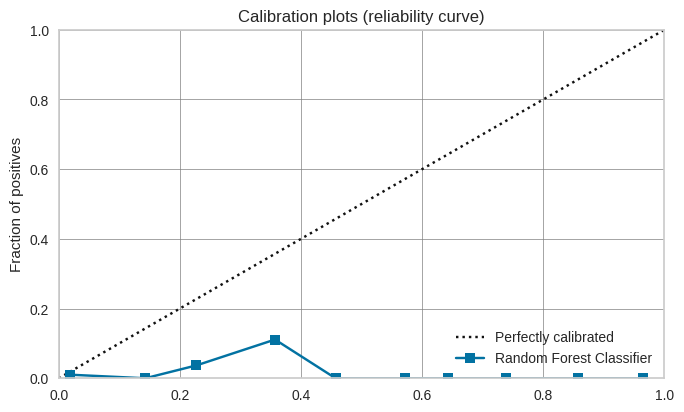

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(rf, plot='calibration')

In [ ]:
calibrated_rf = calibrate_model(rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9744,0.5526,0.0,0.0,0.0,0.0,0.0
1,0.9744,0.9474,0.0,0.0,0.0,0.0,0.0
2,0.9487,0.4459,0.0,0.0,0.0,0.0,0.0
3,0.9737,0.0000,0.0,0.0,0.0,0.0,0.0
4,0.9737,0.2162,0.0,0.0,0.0,0.0,0.0
5,0.9737,0.4595,0.0,0.0,0.0,0.0,0.0
6,0.9737,0.7838,0.0,0.0,0.0,0.0,0.0
7,0.9737,0.9730,0.0,0.0,0.0,0.0,0.0
8,0.9737,0.6216,0.0,0.0,0.0,0.0,0.0


INFO:logs:create_model_container: 33
INFO:logs:master_model_container: 33
INFO:logs:display_container: 21
INFO:logs:CalibratedClassifierCV(base_estimator=RandomForestClassifier(bootstrap=True,
                                                             ccp_alpha=0.0,
                                                             class_weight=None,
                                                             criterion='gini',
                                                             max_depth=None,
                                                             max_features='auto',
                                                             max_leaf_nodes=None,
                                                             max_samples=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=

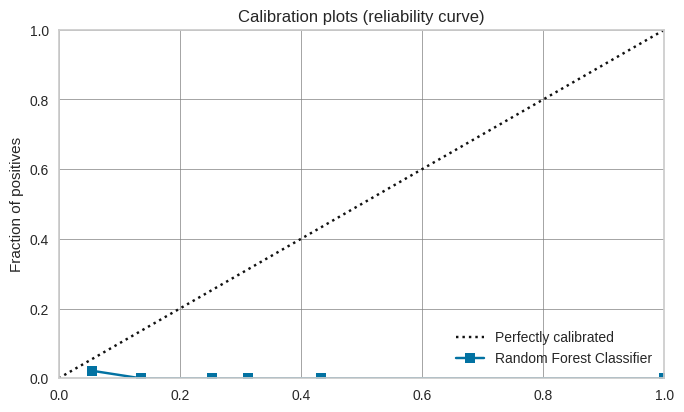

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(calibrated_rf, plot='calibration')


In [ ]:
calibrated_rf_isotonic = calibrate_model(rf, method = 'isotonic')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9744,0.5132,0.0,0.0,0.0,0.0,0.0
1,0.9744,0.9342,0.0,0.0,0.0,0.0,0.0
2,0.9487,0.2703,0.0,0.0,0.0,0.0,0.0
3,0.9737,0.7568,0.0,0.0,0.0,0.0,0.0
4,0.9737,0.8243,0.0,0.0,0.0,0.0,0.0
5,0.9737,0.5541,0.0,0.0,0.0,0.0,0.0
6,0.9737,0.7297,0.0,0.0,0.0,0.0,0.0
7,0.9737,0.9595,0.0,0.0,0.0,0.0,0.0
8,0.9737,0.6892,0.0,0.0,0.0,0.0,0.0


INFO:logs:create_model_container: 34
INFO:logs:master_model_container: 34
INFO:logs:display_container: 22
INFO:logs:CalibratedClassifierCV(base_estimator=RandomForestClassifier(bootstrap=True,
                                                             ccp_alpha=0.0,
                                                             class_weight=None,
                                                             criterion='gini',
                                                             max_depth=None,
                                                             max_features='auto',
                                                             max_leaf_nodes=None,
                                                             max_samples=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=

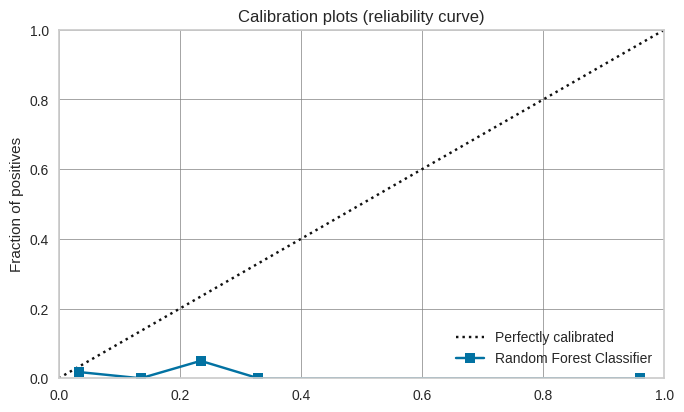

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(calibrated_rf_isotonic, plot='calibration')


In [ ]:
!mlflow ui

[2022-09-06 18:16:24 +0000] [7880] [INFO] Starting gunicorn 20.1.0
[2022-09-06 18:16:24 +0000] [7880] [INFO] Listening at: http://127.0.0.1:5000 (7880)
[2022-09-06 18:16:24 +0000] [7880] [INFO] Using worker: sync
[2022-09-06 18:16:24 +0000] [7883] [INFO] Booting worker with pid: 7883

